## Imports

In [1]:
import sys

sys.path.append('/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_epithelium_db/src')

In [2]:
import os
import cv2
import time
import json
import random
import joblib
import random
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize
from posprocesing.feature_extraction import nuclei_feature_extraction

## Load images and masks and extract nuclei features

In [3]:
src_folder_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/Lady'

with open('/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_epithelium_db/src/config.json', 'r') as config_file:
        config = json.load(config_file)

PATH_TO_MASKS = os.path.join(src_folder_path,'new_masks')
PATH_TO_IMAGE = os.path.join(src_folder_path,'patches')

images_name = os.listdir(PATH_TO_IMAGE)

# Create df to save nuclei data
nuclei_df = pd.DataFrame(columns=['image_name', 'contour', 'perimeter', 'area', 'circularity', 'intensity', \
                                      'texture_R', 'texture_U', 'texture_E'])

# Start timer
start_time = time.time()

for image_name in tqdm(images_name[:100]):
    # Load image and mask
    image = cv2.imread(os.path.join(PATH_TO_IMAGE, image_name))
    mask = cv2.imread(os.path.join(PATH_TO_MASKS, image_name))
    mask = mask[:,:,config['channel_nuclei']]
    # Set a threshold in the mask to binarize it
    mask[mask>0]=255
    # Extract nuclei features and save them in the df
    nuclei_data_dict = nuclei_feature_extraction(image, mask)
    nuclei_data_dict['image_name'] = image_name
    tmp_df = pd.DataFrame(nuclei_data_dict)
    nuclei_df = pd.concat([nuclei_df, tmp_df], ignore_index=True)

# End timer
end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

nuclei_count = nuclei_df.shape[0]
print (nuclei_count)

100%|█████████████████████████████████████████| 100/100 [00:26<00:00,  3.83it/s]

Elapsed time:  26.118858814239502
9439


In [4]:
def nuclei_features(image: np.ndarray, mask: np.ndarray):

    # 1. Separate all nuclei instances and calculate statistics.
    num_labels, nuclei_instances, stats, centroids = cv2.connectedComponentsWithStats(mask)

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # 2. Iterate over each nucleus and calculate features.
    for j in range(1,num_labels):

        nuclei_mask = ((nuclei_instances==j)*255).astype('uint8')
        output = cv2.findContours(image=nuclei_mask, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)
    return output

In [25]:
src_folder_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/Lady'

PATH_TO_MASKS = os.path.join(src_folder_path,'new_masks')
PATH_TO_IMAGE = os.path.join(src_folder_path,'patches')

images_name = os.listdir(PATH_TO_IMAGE)
image = cv2.imread(os.path.join(PATH_TO_IMAGE, images_name[0]))
mask = cv2.imread(os.path.join(PATH_TO_MASKS, images_name[0]))
mask = mask[:,:,config['channel_nuclei']]
# Set a threshold in the mask to binarize it
mask[mask>0]=255

esto = nuclei_features(image, mask)

In [38]:
type(esto[1])

numpy.ndarray

In [ ]:
src_folder_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/44-pre_epithelium'

PATH_TO_MASKS = os.path.join(src_folder_path,'new_masks')
PATH_TO_IMAGE = os.path.join(src_folder_path,'patches')

images_name = os.listdir(PATH_TO_IMAGE)

# Start timer
start_time = time.time()

for image_name in tqdm(images_name[100:200]):
    # Load image and mask
    image = cv2.imread(os.path.join(PATH_TO_IMAGE, image_name))
    mask = cv2.imread(os.path.join(PATH_TO_MASKS, image_name))
    mask = mask[:,:,config['channel_nuclei']]
    # Set a threshold in the mask to binarize it
    mask[mask>0]=255
    # Extract nuclei features and save them in the df
    nuclei_data_dict = nuclei_feature_extraction(image, mask)
    nuclei_data_dict['image_name'] = image_name
    tmp_df = pd.DataFrame(nuclei_data_dict)
    nuclei_df = pd.concat([nuclei_df, tmp_df], ignore_index=True)

# End timer
end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

nuclei_count = nuclei_df.shape[0] - nuclei_count
print (nuclei_count)

 54%|██████████████████████▋                   | 54/100 [00:18<00:15,  3.05it/s]

In [ ]:
src_folder_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/44-D5_epithelium'

PATH_TO_MASKS = os.path.join(src_folder_path,'new_masks')
PATH_TO_IMAGE = os.path.join(src_folder_path,'patches')

images_name = os.listdir(PATH_TO_IMAGE)

# Start timer
start_time = time.time()

for image_name in tqdm(images_name[:100]):
    # Load image and mask
    image = cv2.imread(os.path.join(PATH_TO_IMAGE, image_name))
    mask = cv2.imread(os.path.join(PATH_TO_MASKS, image_name))
    mask = mask[:,:,config['channel_nuclei']]
    # Set a threshold in the mask to binarize it
    mask[mask>0]=255
    # Extract nuclei features and save them in the df
    nuclei_data_dict = nuclei_feature_extraction(image, mask)
    nuclei_data_dict['image_name'] = image_name
    tmp_df = pd.DataFrame(nuclei_data_dict)
    nuclei_df = pd.concat([nuclei_df, tmp_df], ignore_index=True)

# End timer
end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

nuclei_count = nuclei_df.shape[0] - nuclei_count
print (nuclei_count)

In [ ]:
# Filter nuclei with area below 10
all_data = nuclei_df.copy()
nuclei_df = nuclei_df[nuclei_df['area']>10]
all_data.shape, nuclei_df.shape

In [104]:
# Function for marking in a image the nuclei with high circularity
def other_high_circularity(images: list, nuclei_df: pd.DataFrame, images_names: np.ndarray):
    '''
    cv2 documentation about functions use in this script:
    
    cv2.drawContours parameters:
        img -> source image
        contours -> contours which should be passed as a Python list
        index of contours -> useful when drawing individual contour. To draw all contours, pass -1.
        color
        thickness
    '''
    
    fig = plt.figure(figsize=(15,20))

    for i in range(3):

        # Select the nuclei with high circularity and get their contours
        contours_high_circularity_nuclei = nuclei_df[nuclei_df['image_name']==images_names[i]]['contour'].to_list()

        # Draw the contours in the image
        selected_image = images[i].copy()
        cv2.drawContours(selected_image, contours_high_circularity_nuclei, -1, (0,255,0), 3)

        this_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_classification/tiny_nuclei_detection'
        save_path = os.path.join(this_path, images_name[i][:-4]+'_dection.png')
        cv2.imwrite(save_path, selected_image)

        fig.add_subplot(3, 1, i+1)
        plt.imshow(selected_image)
        plt.axis('off')


    fig.suptitle('Nuclei with high circularity', fontsize=25)
    plt.tight_layout()
    plt.show() 

In [107]:
this_image_name = 'Lady_epithelium_0_12288_64512.png'
this_image = cv2.imread(os.path.join(PATH_TO_IMAGE, this_image_name))
PATH_TO_MASKS = os.path.join(src_folder_path,'new_masks')
mask_image = cv2.imread(os.path.join(PATH_TO_MASKS, this_image_name))
mask_image = mask_image[:,:,config['channel_nuclei']]
num_labels, nuclei_instances, stats, centroids = cv2.connectedComponentsWithStats(mask_image)
image_copy = this_image.copy()
for i in range(1, num_labels):
    image_copy[i==nuclei_instances] = [np.random.randint(0,225), np.random.randint(0,255), np.random.randint(0,255)]
    
cv2.imshow('image and high circularity image',image_copy)
cv2.waitKey(0)
cv2.destroyAllWindows()

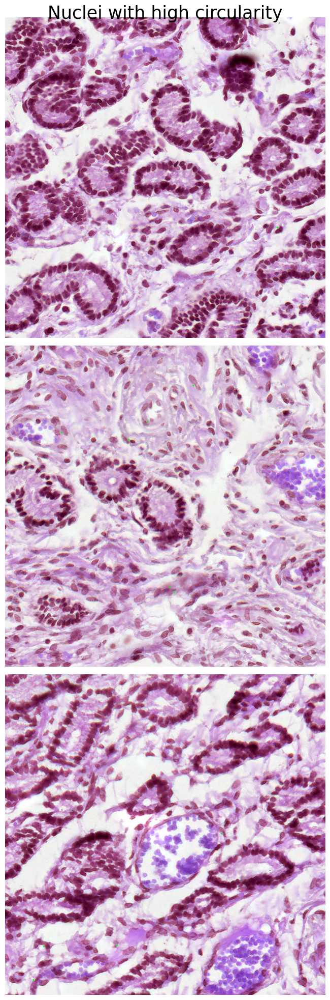

In [105]:
src_folder_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/Lady'
PATH_TO_IMAGE = os.path.join(src_folder_path,'patches')
images_name = ['Lady_epithelium_0_100352_25600.png', 'Lady_epithelium_0_100352_34816.png', 'Lady_epithelium_0_101376_26624.png', 'Lady_epithelium_0_101376_30720.png', 'Lady_epithelium_0_101376_38912.png', 'Lady_epithelium_0_101376_40960.png', 'Lady_epithelium_0_101376_43008.png', 'Lady_epithelium_0_102400_41984.png', 'Lady_epithelium_0_1024_37888.png', 'Lady_epithelium_0_1024_41984.png', 'Lady_epithelium_0_103424_36864.png', 'Lady_epithelium_0_104448_37888.png', 'Lady_epithelium_0_106496_25600.png', 'Lady_epithelium_0_112640_21504.png', 'Lady_epithelium_0_112640_24576.png', 'Lady_epithelium_0_11264_35840.png', 'Lady_epithelium_0_12288_20480.png', 'Lady_epithelium_0_12288_64512.png', 'Lady_epithelium_0_13312_61440.png', 'Lady_epithelium_0_13312_65536.png']

# Select 3 random images
# selected_images = np.random.choice(images_name, 3, replace=False)
selected_images = ['Lady_epithelium_0_11264_35840.png', 'Lady_epithelium_0_12288_64512.png', 'Lady_epithelium_0_100352_25600.png']
# Load images
images = [cv2.imread(os.path.join(PATH_TO_IMAGE, image_name)) for image_name in selected_images]
# Run kmeans and plot results

mask = ((X_norm['circularity']>=0.9575)&(X_norm['circularity']<=0.9625))
other_high_circularity(images=images, nuclei_df = nuclei_df[mask], images_names=selected_images)

In [32]:
# Function for marking in a image the nuclei with high circularity
def nuclei_high_circularity(images: list, masks: list, percentile: int, nuclei_df: pd.DataFrame, images_names: np.ndarray):
    '''
    cv2 documentation about functions use in this script:
    
    cv2.drawContours parameters:
        img -> source image
        contours -> contours which should be passed as a Python list
        index of contours -> useful when drawing individual contour. To draw all contours, pass -1.
        color
        thickness
    '''
    
    fig = plt.figure(figsize=(15,15))

    for i in np.arange(0,5,2):

        # Select the nuclei with high circularity and get their contours
        high_circularity_nuclei = nuclei_df[nuclei_df['image_name']==images_names[i%3]]['circularity']>np.percentile(nuclei_df['circularity'],percentile) 
        contours_high_circularity_nuclei = nuclei_df[nuclei_df['image_name']==images_names[i%3]][high_circularity_nuclei]['contour'].to_list()

        # Draw the contours in the image
        selected_image = images[i%3].copy()
        cv2.drawContours(selected_image, contours_high_circularity_nuclei, -1, (0,255,0), 3)

        this_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_classification/high_circularity_nuclei_90'
        detection_path = os.path.join(this_path, images_name[i%3][:-4]+'_detection.png')
        image_path = os.path.join(this_path, images_name[i%3])
        mask_path = os.path.join(this_path, images_name[i%3][:-4]+'_mask.png')
        
        esto = cv2.addWeighted(cv2.cvtColor(images[i%3], cv2.COLOR_BGR2RGB),0.7,masks[i%3],0.7,0)
        
        
        cv2.imwrite(image_path, images[i%3])
        cv2.imwrite(detection_path, selected_image)
        cv2.imwrite(mask_path, esto)
        
        
        fig.add_subplot(3, 2, i+1)
        plt.imshow(images[i%3])
        plt.axis('off')
        fig.add_subplot(3, 2, i+2)
        plt.imshow(selected_image)
        plt.axis('off')


    fig.suptitle('Nuclei with high circularity', fontsize=25)
    plt.tight_layout()
    plt.show() 


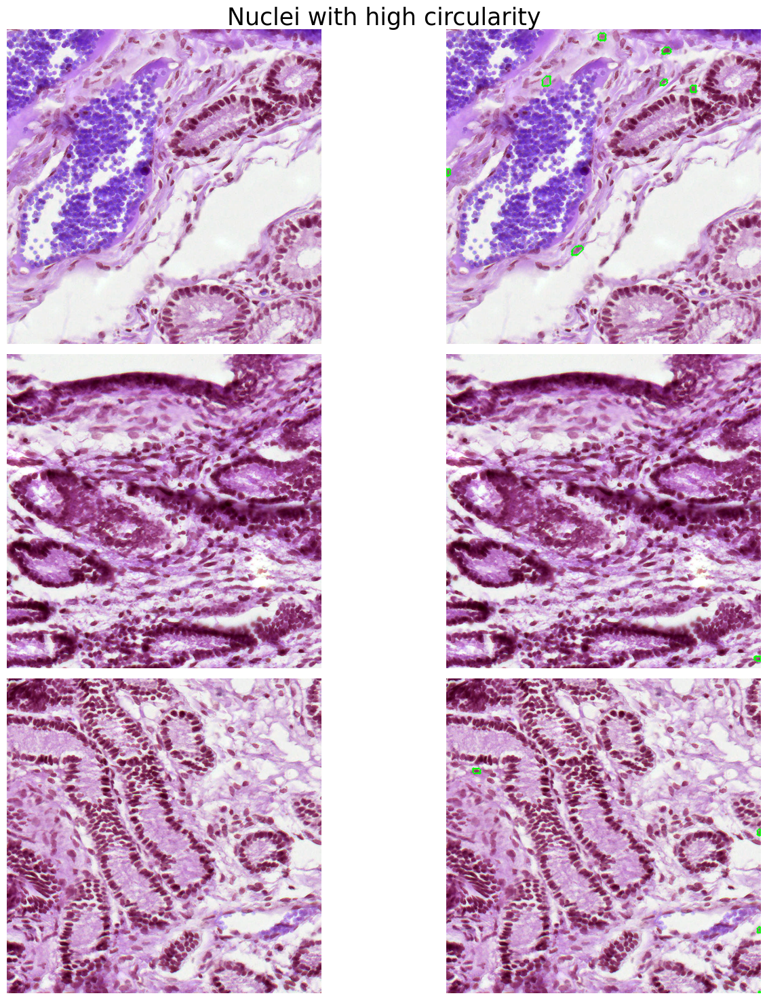

In [36]:
src_folder_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/Lady'
PATH_TO_IMAGE = os.path.join(src_folder_path,'patches')
PATH_TO_MASKS = os.path.join(src_folder_path,'new_masks')
images_name = os.listdir(PATH_TO_IMAGE)[:100]

# Select 2 random images
selected_images = np.random.choice(images_name, 3, replace=False)
# Load images
images = [cv2.imread(os.path.join(PATH_TO_IMAGE, image_name)) for image_name in selected_images]
masks = [cv2.imread(os.path.join(PATH_TO_MASKS, image_name)) for image_name in selected_images]
   
for i, mask  in enumerate(masks):
    mask[:,:,0] = mask[:,:,config['channel_nuclei']]
    mask[:,:,1] = mask[:,:,config['channel_nuclei']]

percentile = 90
# Mark in the images the nuclei with high circularity
nuclei_high_circularity(images, masks, percentile, nuclei_df, selected_images)

## Normalize features before Kmeans

In [13]:
# Normalize each feature not considering outliers
X_norm = nuclei_df[['area', 'circularity', 'intensity', 'texture_R', 'texture_U', 'texture_E']]
percentile_lower = np.percentile(a=X_norm, q=0.1, axis=0)
percentile_upper = np.percentile(a=X_norm, q=99.9, axis=0)
X_norm = (X_norm - percentile_lower) / (percentile_upper - percentile_lower)

## Clustering algorithm

In [41]:
kmeans = KMeans(n_clusters=8, random_state=0, n_init="auto").fit(X_norm.values)

In [42]:
# Save model
kmeans_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_classification/kmeans_8'

joblib.dump(kmeans, os.path.join(kmeans_path,'kmeans_8.joblib'))

['/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_classification/kmeans_8/kmeans_8.joblib']

## Load chosen model and make a prediction over a dataset

In [60]:
kmeans_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_classification/kmeans_5'
model = joblib.load(os.path.join(kmeans_path,'kmeans_5.joblib'))
clusters = model.predict(X_norm.values)

## Inference over test images

In [44]:
# Dictionary with BGR colors
colors = {
    0: (0, 0, 255),        # Red
    1: (0, 255, 255),      # Yellow
    2: (255, 0, 0),        # Blue
    3: (0, 255, 0),        # Green
    4: (255, 0, 255),      # Purple
    5: (255, 255, 0),      # Cyan
    6: (255, 0, 255),      # Magenta
    7: (0, 165, 255),      # Orange
    8: (192, 192, 192),    # Silver
    9: (147, 20, 255),     # Pink
    10: (128, 128, 0),     # Teal
    11: (0, 42, 42),       # Brown
    12: (128, 128, 128),   # Gray
    13: (0, 128, 128),     # Olive
    14: (0, 0, 128)        # Maroon
}

In [45]:
def run_kmeans_test(image: np.ndarray, percentile_lower: np.ndarray, percentile_upper: np.ndarray, nuclei_df: pd.DataFrame, \
                    save_images: bool, kmeans_path: str, image_name: str, colors: dict, model)-> np.ndarray:
    '''
    cv2 documentation about functions use in this script:
    
    cv2.drawContours parameters:
        img -> source image
        contours -> contours which should be passed as a Python list
        index of contours -> useful when drawing individual contour. To draw all contours, pass -1.
        color
        thickness
    '''

    image_copy = image.copy()

    # Normalize each feature using percentile_lower and percentile_upper from training data
    X_test = nuclei_df[nuclei_df['image_name']==image_name][['area', 'circularity', 'intensity', 'texture_R', 'texture_U', 'texture_E']]
    X_test = (X_test - percentile_lower) / (percentile_upper - percentile_lower)

    # Run the model over the dataset test
    prediction = model.predict(X_test.values)

    for label in np.unique(model.labels_):
        # nuclei_idx = [idx[0] for idx in np.argwhere(prediction==label)]
        # contours_list = []
        # for idx in nuclei_idx:
        #     contours_list.append(nuclei_data_dict[image_name]['contours'][idx])
        contours_list = nuclei_df[nuclei_df['image_name']==image_name][prediction==label]['contour'].to_list()
        cv2.drawContours(image_copy, contours_list, -1, colors[label], 3)

    if save_images:
        cv2.imwrite(os.path.join(kmeans_path, image_name), image_copy)

    return X_test

In [49]:
test_images_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/Dataset_test'

PATH_TO_TEST_MASKS = os.path.join(test_images_path,'new_masks')
PATH_TO_TEST_IMAGES = os.path.join(test_images_path,'patches')

images_test = os.listdir(PATH_TO_TEST_IMAGES)

# Load images and masks and extract nuclei features
for image_name in tqdm(images_test):
    # Load image and mask
    image = cv2.imread(os.path.join(PATH_TO_TEST_IMAGES, image_name))
    mask = cv2.imread(os.path.join(PATH_TO_TEST_MASKS, image_name))
    mask = mask[:,:,config['channel_nuclei']]
    # Extract nuclei features and save them in the df
    nuclei_data_dict = nuclei_feature_extraction(image, mask)
    nuclei_data_dict['image_name'] = image_name
    tmp_df = pd.DataFrame(nuclei_data_dict)
    nuclei_df = pd.concat([nuclei_df, tmp_df], ignore_index=True)


100%|███████████████████████████████████████████| 18/18 [00:04<00:00,  3.87it/s]


In [58]:
X_test = pd.DataFrame(columns=['area', 'circularity', 'intensity', \
                                      'texture_R', 'texture_U', 'texture_E'])

for image_name in tqdm(images_test):
    image = cv2.imread(os.path.join(PATH_TO_TEST_IMAGES, image_name))

    tmp_df = run_kmeans_test(image=image, percentile_lower=percentile_lower, percentile_upper=percentile_upper, \
                             nuclei_df=nuclei_df, save_images=True, kmeans_path=kmeans_path, image_name=image_name, \
                             colors = colors, model=model)
    X_test = pd.concat([X_test, tmp_df])

100%|███████████████████████████████████████████| 18/18 [00:01<00:00, 12.76it/s]


In [89]:
pca = PCA(n_components=3)
data = pca.fit_transform(X_norm.values)
print(pca.components_)
print(pca.explained_variance_ratio_)

[[-0.26707846 -0.24607492  0.11710367 -0.44211902  0.47568524 -0.65776689]
 [ 0.85140311 -0.30367373 -0.22416971 -0.3523216   0.08781162  0.02831206]
 [ 0.10803286 -0.4953998   0.08439553  0.74001609  0.43288031 -0.02785967]]
[0.53121549 0.17414695 0.15187762]


In [ ]:
fig = go.Figure()

for i in np.unique(clusters):
    fig.add_trace(go.Scatter(x=data[clusters == i, 0], y=data[clusters == i, 1], mode='markers', \
                                marker=dict(size=3, color='rgb'+str(colors[i][::-1])), name = str(i)))

fig.update_layout(
    autosize=False,
    width=800,
    height=800,
    legend= {'itemsizing': 'constant'}
)

fig.show()

In [ ]:
fig = go.Figure()

for i in np.unique(clusters):
    fig.add_trace(go.Scatter3d(x=data[clusters == i, 0], y=data[clusters == i, 1], z=data[clusters == i, 2], mode='markers', \
                                marker=dict(size=2, color='rgb'+str(colors[i][::-1])), name = str(i)))

fig.update_layout(
    autosize=False,
    width=800,
    height=800,
    legend= {'itemsizing': 'constant'}
)
fig.show()

In [59]:
features = X_norm.columns

def plot_histogram (data: np.ndarray, feature: str, colors: dict, clusters: np.ndarray, log: bool):
    fig = go.Figure()

    for i in np.unique(clusters):

        fig.add_trace(go.Histogram(x=data[clusters==i], name = str(i), marker=dict(color='rgb'+str(colors[i][::-1]))))

    if log:
        fig.update_yaxes(type="log")
    fig.update_layout(
        title_text='Histogram of ' + feature, # title of plot
        xaxis_title_text=feature, # xaxis label
        yaxis_title_text='Count', # yaxis label
    )
    fig.show()

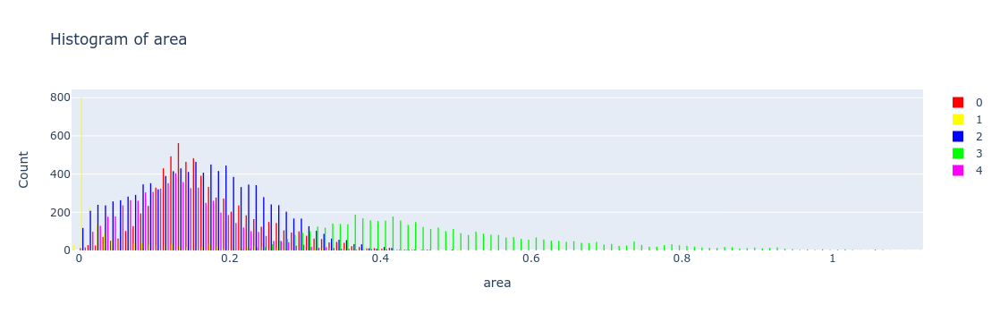

In [61]:
plot_histogram (X_norm.iloc[:,0].values, features[0], colors, clusters, log=False)

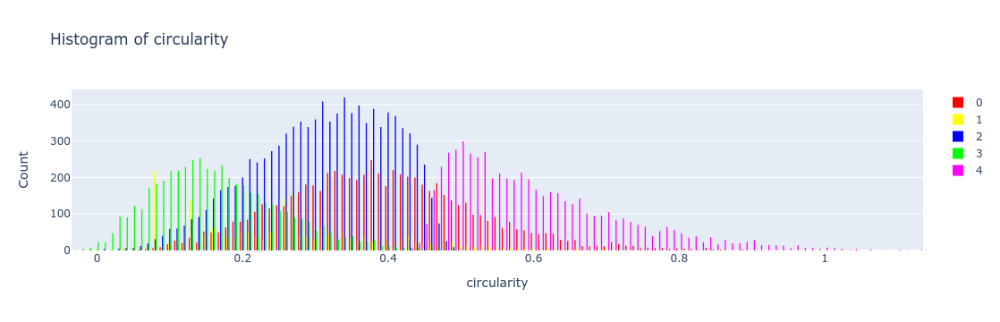

In [62]:
plot_histogram (X_norm.iloc[:,1].values, features[1], colors, clusters, log=False)

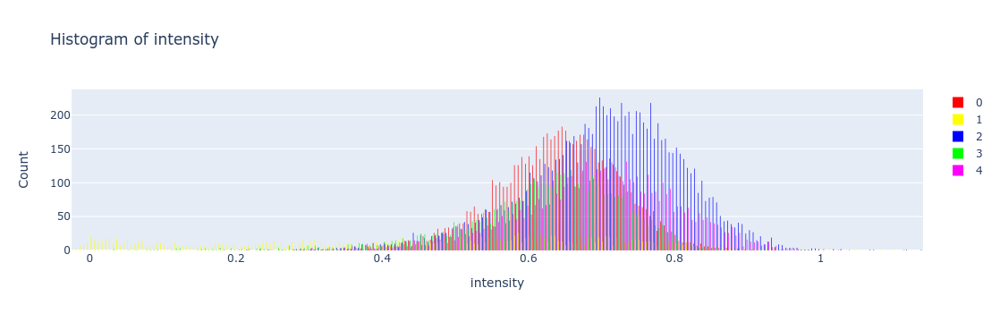

In [63]:
plot_histogram (X_norm.iloc[:,2].values, features[2], colors, clusters, log=False)

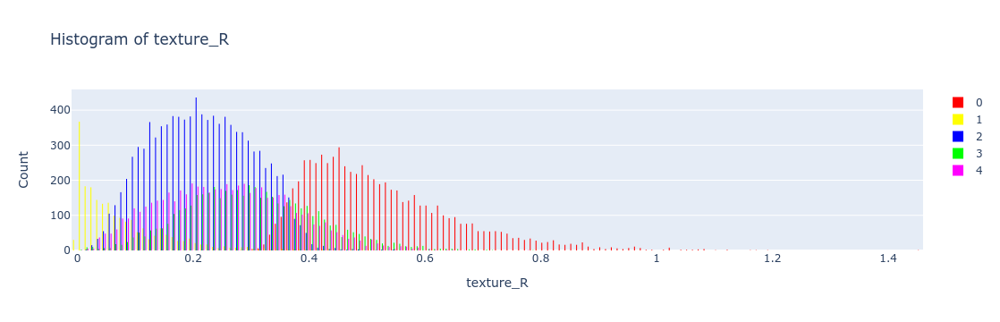

In [64]:
plot_histogram (X_norm.iloc[:,3].values, features[3], colors, clusters, log=False)

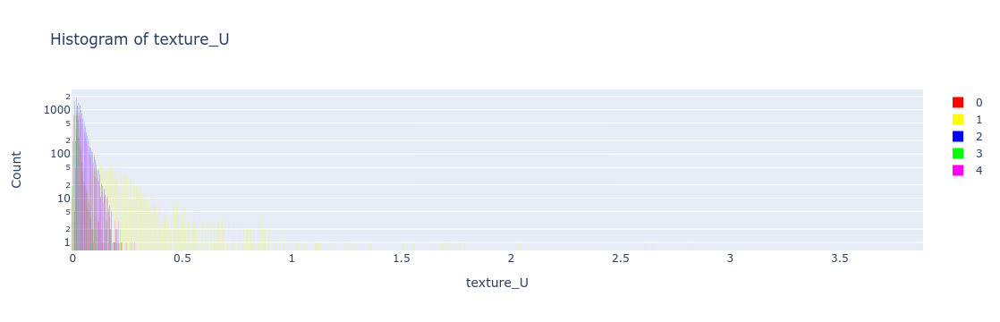

In [65]:
plot_histogram (X_norm.iloc[:,4].values, features[4], colors, clusters, log=True)

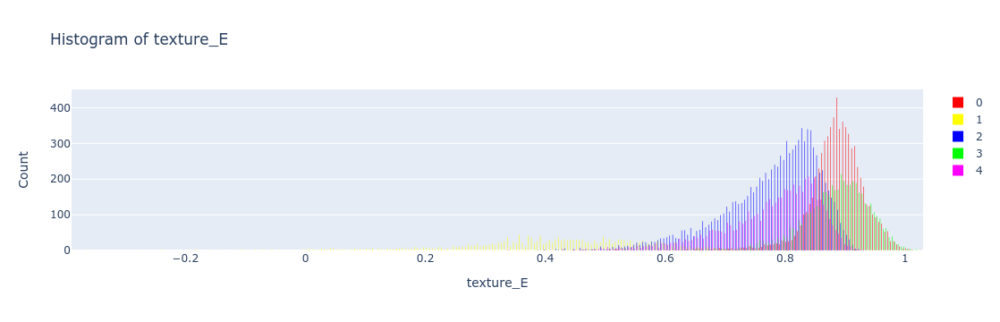

In [66]:
plot_histogram (X_norm.iloc[:,5].values, features[5], colors, clusters, log=False)

In [67]:
df_x_norm = X_norm.copy()
df_x_norm['clusters'] = clusters

/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/WBC_Feature/venv/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning:

The figure layout has changed to tight



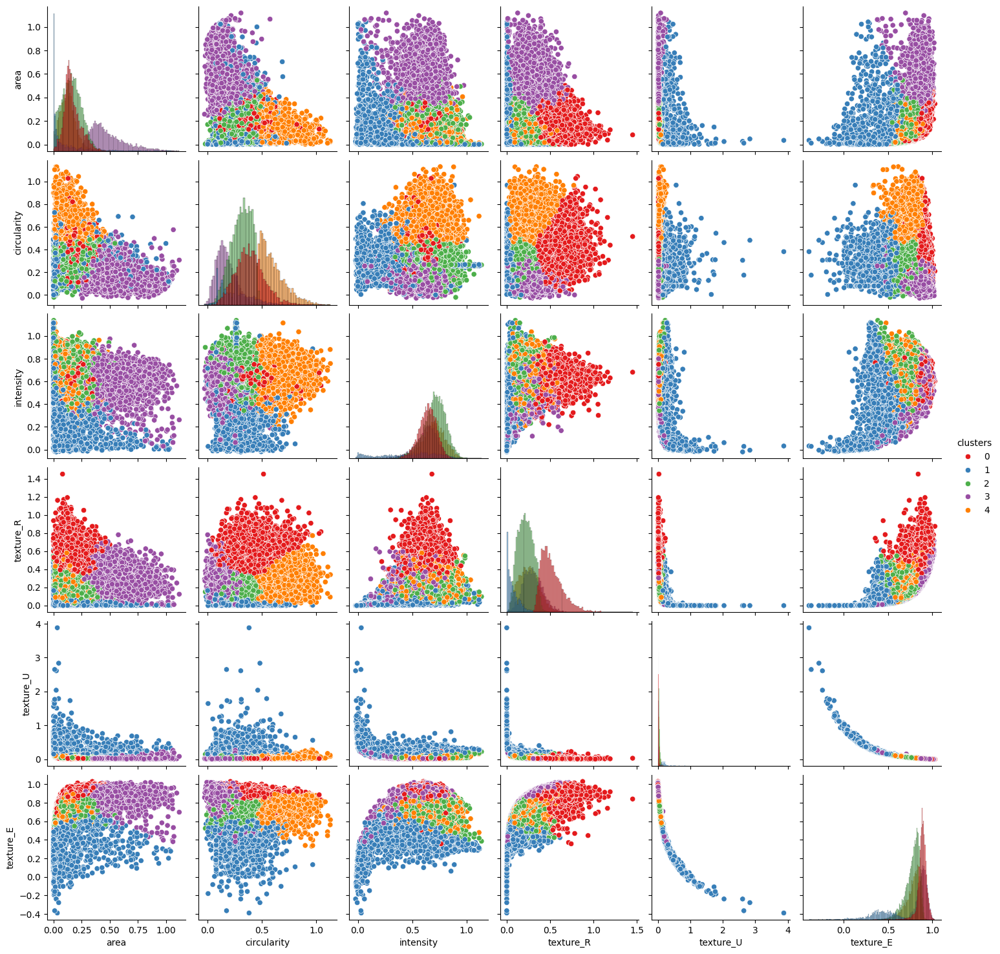

In [68]:
sns.set_palette("Set1")
sns.pairplot(df_x_norm, hue="clusters", diag_kind="hist", palette="Set1")
# sns.pairplot(X_norm, corner=True)

## Histograms of the whole population (without segmentating by cluster)

In [14]:
features = X_norm.columns

In [ ]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=X_norm.iloc[:,0].values, histnorm='probability'))

fig.update_layout(
    title_text='Histogram of ' + features[0], # title of plot
    xaxis_title_text=features[0], # xaxis label
    # yaxis_title_text='Count', # yaxis label
    yaxis_title_text='Probability', # yaxis label
)
fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=X_norm.iloc[:,1].values, histnorm='probability'))

fig.update_layout(
    title_text='Histogram of ' + features[1], # title of plot
    xaxis_title_text=features[1], # xaxis label
    # yaxis_title_text='Count', # yaxis label
    yaxis_title_text='Probability', # yaxis label
)
fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=X_norm.iloc[:,2].values, histnorm='probability'))

fig.update_layout(
    title_text='Histogram of ' + features[2], # title of plot
    xaxis_title_text=features[2], # xaxis label
    # yaxis_title_text='Count', # yaxis label
    yaxis_title_text='Probability', # yaxis label
)
fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=X_norm.iloc[:,3].values, histnorm='probability'))

fig.update_layout(
    title_text='Histogram of ' + features[3], # title of plot
    xaxis_title_text=features[3], # xaxis label
    # yaxis_title_text='Count', # yaxis label
    yaxis_title_text='Probability', # yaxis label
)
fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=X_norm.iloc[:,4].values, histnorm='probability'))

# fig.update_yaxes(type="log")
fig.update_layout(
    title_text='Histogram of ' + features[4], # title of plot
    xaxis_title_text=features[4], # xaxis label
    # yaxis_title_text='Count (logarithmic scale)', # yaxis label
    yaxis_title_text='Probability', # yaxis label
)

fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=X_norm.iloc[:,5].values, histnorm='probability'))

fig.update_layout(
    title_text='Histogram of ' + features[5], # title of plot
    xaxis_title_text=features[5], # xaxis label
    # yaxis_title_text='Count', # yaxis label
    yaxis_title_text='Probability', # yaxis label
)
fig.show()

## Hard thresholds to identify lymphocytes

In [76]:
nuclei_above_threshold_index = X_test[(X_test['area']< 0.315)&(X_test['texture_R']> 0.335)].index
nuclei_above_threshold_img_names = nuclei_df.loc[nuclei_above_threshold_index]['image_name'].to_list()
nuclei_above_threshold_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_classification/nuclei_above_threshold'

for image_name in tqdm(np.unique(nuclei_above_threshold_img_names)):
    # Load image and mask
    image = cv2.imread(os.path.join(PATH_TO_TEST_IMAGES, image_name))
    duplicated_image = image.copy()
    nuclei_above_threshold_contours = nuclei_df.loc[nuclei_above_threshold_index][nuclei_df.loc[nuclei_above_threshold_index]['image_name']==image_name]\
    ['contour'].to_list()
    cv2.drawContours(duplicated_image, nuclei_above_threshold_contours, -1, (0,255,0), 3)
    duplicated_image_path = os.path.join(nuclei_above_threshold_path, image_name[:-4]+'_linfo.png')
    cv2.imwrite(duplicated_image_path, duplicated_image)

100%|███████████████████████████████████████████| 18/18 [00:01<00:00, 15.99it/s]
